In [68]:
import pandas as pd

df = pd.read_csv("999_selected_features_70days.csv")

df

,Unnamed: 0,cases_70days,icu_beds,commuting_in,commuting_out,density,percent_democrat,percent_in_poverty,pop_over65,median_age,percent_with_bachelors,median_income,pop_2019
0,0,1228,72,54070,130657,393.996419,0.542634,7.5,99868,37.8,31.9,87096,822083
1,1,6473,1606,489235,317505,5450.384359,0.743758,13.8,724730,36.6,38.0,63347,5150233
2,2,786,651,317959,235247,4005.616646,0.509602,10.5,440488,37.8,39.9,89373,3175692
3,3,5940,2126,483659,334665,2473.507350,0.714072,14.2,1299277,36.2,31.8,67986,10039107
4,4,1326,1004,79525,40810,487.509549,0.456797,12.3,615277,36.1,32.0,65234,4485414
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2005,2039,12,0,1182,4004,30.562377,0.376029,11.1,3926,44.7,18.8,54663,19439
2006,2040,38,4,4059,5321,102.910184,0.220170,12.1,6683,44.8,18.8,52388,31100
2007,2041,21,6,2660,1862,56.183317,0.330414,17.1,3106,39.7,13.2,45661,19273
2008,2042,20,4,1458,1754,37.277258,0.304395,15.5,2728,36.1,21.9,49332,16073


In [69]:
import seaborn as sns
target = df["cases_70days"] 
df = df.drop(["cases_70days"], axis = 1)

In [70]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df, target, random_state=3000)

selector = SelectKBest(f_classif, k = 7)
selector.fit(X_train, y_train)

X_train_selected = selector.transform(df)
columns = []
for i in range(len(selector.get_support())):
    if selector.get_support()[i]:
        columns.append(df.columns[i])

df = pd.DataFrame(X_train_selected, columns = columns)    
df["target"] = target
df

,icu_beds,commuting_in,commuting_out,density,pop_over65,median_income,pop_2019,target
0,72.0,54070.0,130657.0,393.996419,99868.0,87096.0,822083.0,1228
1,1606.0,489235.0,317505.0,5450.384359,724730.0,63347.0,5150233.0,6473
2,651.0,317959.0,235247.0,4005.616646,440488.0,89373.0,3175692.0,786
3,2126.0,483659.0,334665.0,2473.507350,1299277.0,67986.0,10039107.0,5940
4,1004.0,79525.0,40810.0,487.509549,615277.0,65234.0,4485414.0,1326
...,...,...,...,...,...,...,...,...
2005,0.0,1182.0,4004.0,30.562377,3926.0,54663.0,19439.0,12
2006,4.0,4059.0,5321.0,102.910184,6683.0,52388.0,31100.0,38
2007,6.0,2660.0,1862.0,56.183317,3106.0,45661.0,19273.0,21
2008,4.0,1458.0,1754.0,37.277258,2728.0,49332.0,16073.0,20


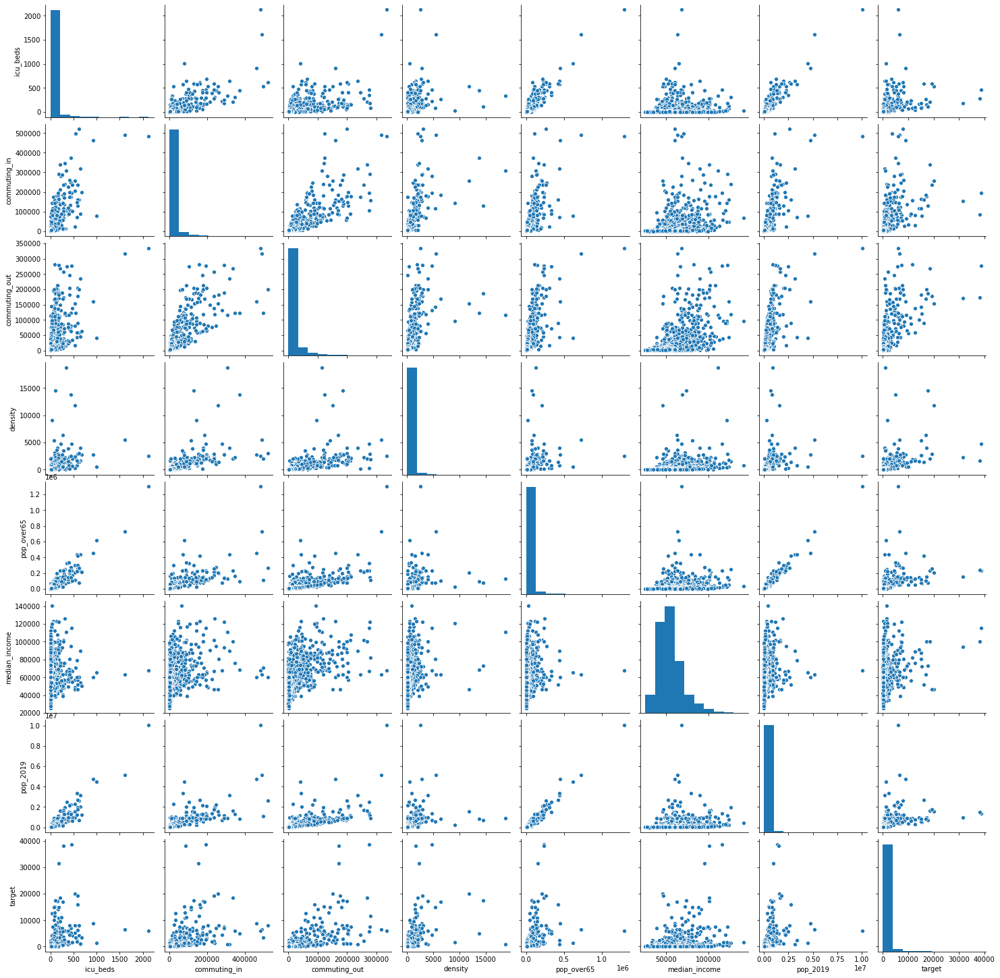

In [71]:
sns.pairplot(df)
